In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
from pandas import DataFrame, Series
import warnings
from scipy import signal, stats
from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.decomposition import PCA

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
#set_matplotlib_formats('pdf', 'svg')
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("white")
sns.set_context("notebook")

/home/kmt/anaconda3/envs/simons/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
from pathlib import Path
from geneinfo import connect_mygene, geneinfo, geneplot
import mygene
mg = mygene.MyGeneInfo()
connect_mygene(mg)

In [44]:
csv_dir = Path('csv')
df_list = []
for path in csv_dir.glob('*.csv'):
    _, chrom, win_start, win_end, pop = path.with_suffix('').name.split('_')
    win_start, win_end = int(win_start), int(win_end)
    df = pd.read_csv(path, sep='\t', header=None, names=['chrom', 'pos', 'population', 'LR', 'sel_coef'])
    df = df.loc[(df.pos >= win_start + 200000) & (df.pos < win_end - 20000)]
    df['window'] = f'{chrom}_{win_start}_{win_end}'
    df_list.append(df)
    
clues_results = pd.concat(df_list).sort_values('pos')
clues_results['color'] = (clues_results.window != clues_results.window.shift()).cumsum() % 2

clues_results.head()

,chrom,pos,population,LR,sel_coef,window,color
0,3,45200254,LWK,9.510328,0.002497,3_45000000_46400000,1
0,3,45200254,YRI,0.000000,0.000010,3_45000000_46400000,1
0,3,45200662,FIN,42.297428,0.001606,3_45000000_46400000,1
0,3,45200662,CEU,0.000000,0.000010,3_45000000_46400000,1
0,3,45200662,GBR,30.211807,0.001287,3_45000000_46400000,1


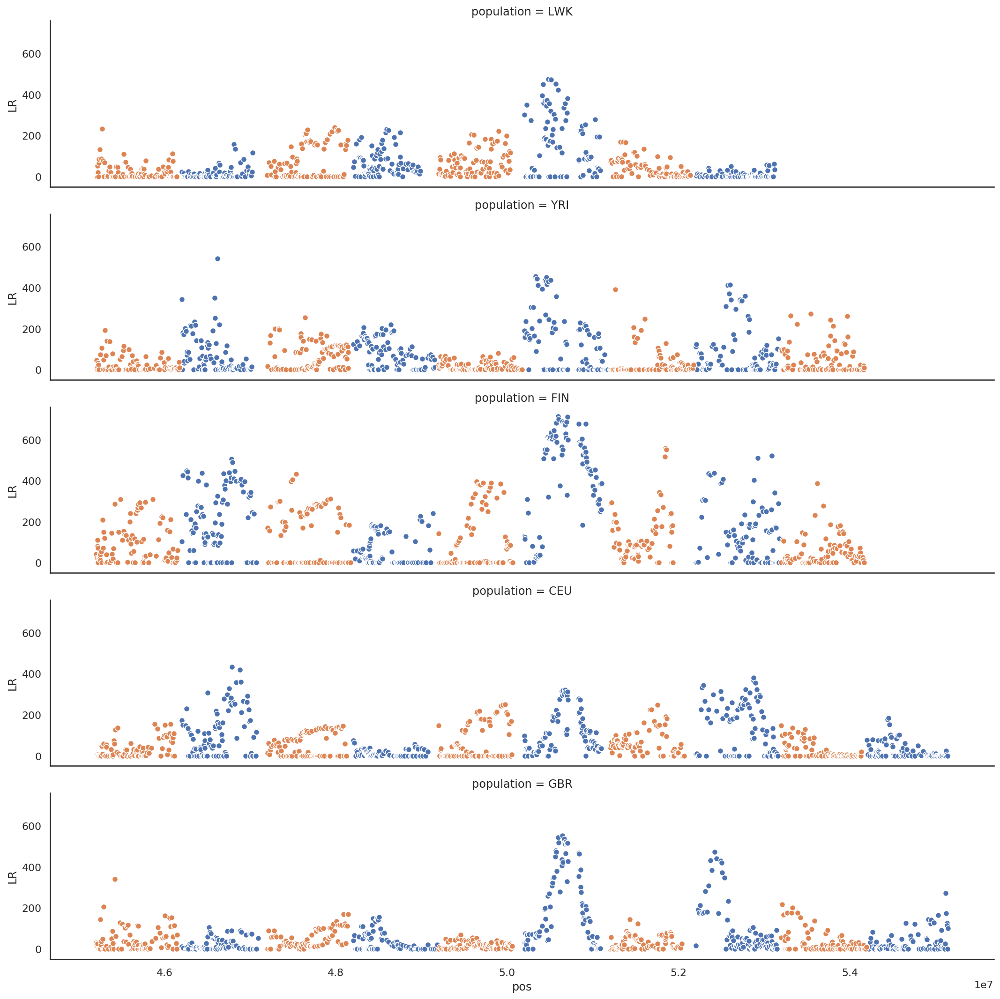

In [47]:
g = sns.FacetGrid(row='population', hue='color', data=clues_results, aspect=5, sharex=True, sharey=True)
g.map(sns.scatterplot, 'pos', 'LR')

In [68]:
chrom, start, end = 'chr3', 45000000, 55000000
population = 'LWK'
plot_df = clues_results.loc[clues_results.population == population]
ax = geneplot(chrom, start, end, figsize=(10, 5), hg19=True)
ax.plot(plot_df.pos, plot_df.LR, 'o')
mpld3.display()

Fetching 347 gene(s) . . .


In [69]:
population = 'YRI'
plot_df = clues_results.loc[clues_results.population == population]
ax = geneplot(chrom, start, end, figsize=(10, 5), hg19=True)
ax.plot(plot_df.pos, plot_df.LR, 'o')
mpld3.display()

Fetching 347 gene(s) . . .


In [70]:
population = 'FIN'
plot_df = clues_results.loc[clues_results.population == population]
ax = geneplot(chrom, start, end, figsize=(10, 5), hg19=True)
ax.plot(plot_df.pos, plot_df.LR, 'o')
mpld3.display()

Fetching 347 gene(s) . . .


In [74]:
population = 'CEU'
plot_df = clues_results.loc[clues_results.population == population]
ax = geneplot(chrom, start, end, figsize=(10, 5), hg19=True)
ax.plot(plot_df.pos, plot_df.LR, 'o')
mpld3.display()

Fetching 347 gene(s) . . .


In [78]:
population = 'GBR'
plot_df = clues_results.loc[clues_results.population == population]
ax = geneplot(chrom, start, end, figsize=(10, 5), hg19=True)
ax.plot(plot_df.pos, plot_df.LR, 'o')
mpld3.display()

Fetching 347 gene(s) . . .


In [ ]:
def gene_band(name, ax):
    "draw gene line/band on axis"

In [79]:
geneinfo(['PRSS50', 'HEMK1', 'MST1R', 'IQCF3', 'PHF7'])

**Symbol:** **_PRSS50_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CT20, TSP50  
*serine protease 50*  
**Genomic position:** 3:46712117-46717869 (hg38), 3:46753605-46854064 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PRSS50)  


 ----

**Symbol:** **_HEMK1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HEMK, MPRMC, MTQ1  
*HemK methyltransferase family member 1*  
**Genomic position:** 3:50569152-50596168 (hg38), 3:50606583-50622366 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HEMK1)  


 ----

**Symbol:** **_MST1R_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CD136, CDw136, NPCA3, PTK8, RON, SEA  
*macrophage stimulating 1 receptor*  
**Summary:** This gene encodes a cell surface receptor for macrophage-stimulating protein (MSP) with tyrosine kinase activity. The mature form of this protein is a heterodimer of disulfide-linked alpha and beta subunits, generated by proteolytic cleavage of a single-chain precursor. The beta subunit undergoes tyrosine phosphorylation upon stimulation by MSP. This protein is expressed on the ciliated epithelia of the mucociliary transport apparatus of the lung, and together with MSP, thought to be involved in host defense. Alternative splicing generates multiple transcript variants encoding different isoforms that may undergo similar proteolytic processing. [provided by RefSeq, Jan 2016].  
**Genomic position:** 3:49887002-49903873 (hg38), 3:49924435-49941299 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MST1R)  


 ----

**Symbol:** **_IQCF3_** (protein-coding)  
*IQ motif containing F3*  
**Genomic position:** 3:51826883-51830856 (hg38), 3:51851620-51864876 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IQCF3)  


 ----

**Symbol:** **_PHF7_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HSPC045, HSPC226, NYD-SP6  
*PHD finger protein 7*  
**Summary:** Spermatogenesis is a complex process regulated by extracellular and intracellular factors as well as cellular interactions among interstitial cells of the testis, Sertoli cells, and germ cells. This gene is expressed in the testis in Sertoli cells but not germ cells. The protein encoded by this gene contains plant homeodomain (PHD) finger domains, also known as leukemia associated protein (LAP) domains, believed to be involved in transcriptional regulation. The protein, which localizes to the nucleus of transfected cells, has been implicated in the transcriptional regulation of spermatogenesis. Alternate splicing results in multiple transcript variants of this gene. [provided by RefSeq, May 2013].  
**Genomic position:** 3:52410660-52423641 (hg38), 3:52444673-52457657 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PHF7)  


 ----